# Librerias

In [19]:
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
plt.style.use('dark_background')

# Dataframe

In [20]:
df = pd.read_csv("movies_df.csv")
df.head()

,id,title,cast,director,release_date,release_year,genres,budget,revenue,return,runtime,status,original_language,production_countries,popularity,vote_average,vote_count,overview
0,862,Toy Story,"['Tom Hanks', 'Tim Allen', 'Don Rickles']",John Lasseter,1995-10-30,1995,"['Animation', 'Comedy', 'Family']",30000000.0,373554033.0,12.451801,81.0,Released,en,['US'],21.946943,7.7,5415.0,"Led by Woody, Andy's toys live happily in his ..."
1,8844,Jumanji,"['Robin Williams', 'Jonathan Hyde', 'Kirsten D...",Joe Johnston,1995-12-15,1995,"['Adventure', 'Fantasy', 'Family']",65000000.0,262797249.0,4.043035,104.0,Released,en,['US'],17.015539,6.9,2413.0,When siblings Judy and Peter discover an encha...
2,15602,Grumpier Old Men,"['Walter Matthau', 'Jack Lemmon', 'Ann-Margret']",Howard Deutch,1995-12-22,1995,"['Romance', 'Comedy']",0.0,0.0,0.000000,101.0,Released,en,['US'],11.712900,6.5,92.0,A family wedding reignites the ancient feud be...
3,31357,Waiting to Exhale,"['Whitney Houston', 'Angela Bassett', 'Loretta...",Forest Whitaker,1995-12-22,1995,"['Comedy', 'Drama', 'Romance']",16000000.0,81452156.0,5.090760,127.0,Released,en,['US'],3.859495,6.1,34.0,"Cheated on, mistreated and stepped on, the wom..."
4,11862,Father of the Bride Part II,"['Steve Martin', 'Diane Keaton', 'Martin Short']",Charles Shyer,1995-02-10,1995,['Comedy'],0.0,76578911.0,0.000000,106.0,Released,en,['US'],8.387519,5.7,173.0,Just when George Banks has recovered from his ...


# Información básica

In [21]:
df.shape

(45423, 18)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45423 entries, 0 to 45422
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    45423 non-null  int64  
 1   title                 45423 non-null  object 
 2   cast                  45423 non-null  object 
 3   director              44588 non-null  object 
 4   release_date          45423 non-null  object 
 5   release_year          45423 non-null  int64  
 6   genres                45423 non-null  object 
 7   budget                45423 non-null  float64
 8   revenue               45423 non-null  float64
 9   return                45423 non-null  float64
 10  runtime               45177 non-null  float64
 11  status                45343 non-null  object 
 12  original_language     45412 non-null  object 
 13  production_countries  45423 non-null  object 
 14  popularity            45423 non-null  float64
 15  vote_average       

In [23]:
df['release_date'] = pd.to_datetime(df['release_date'])

In [24]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
id,45423.0,107989.639015,2.0,26370.5,59860.0,156347.5,469172.0,112127.857295
release_date,45423,1992-05-14 14:43:05.456707072,1874-12-09 00:00:00,1978-10-06 00:00:00,2001-08-31 00:00:00,2010-12-17 00:00:00,2020-12-16 00:00:00,NaN
release_year,45423.0,1991.878211,1874.0,1978.0,2001.0,2010.0,2020.0,24.061563
budget,45423.0,4233859.209938,0.0,0.0,0.0,0.0,380000000.0,17434479.164989
revenue,45423.0,11226191.823548,0.0,0.0,0.0,0.0,2787965087.0,64359070.723832
return,45423.0,659.36041,0.0,0.0,0.0,0.0,12396383.0,74654.642906
runtime,45177.0,94.174314,0.0,85.0,95.0,107.0,1256.0,38.338184
popularity,45423.0,2.927113,0.0,0.389035,1.131154,3.694956,547.488298,6.007817
vote_average,45423.0,5.624025,0.0,5.0,6.0,6.8,10.0,1.915411
vote_count,45423.0,110.036325,0.0,3.0,10.0,34.0,14075.0,491.497956


# Datos faltantes y duplicados

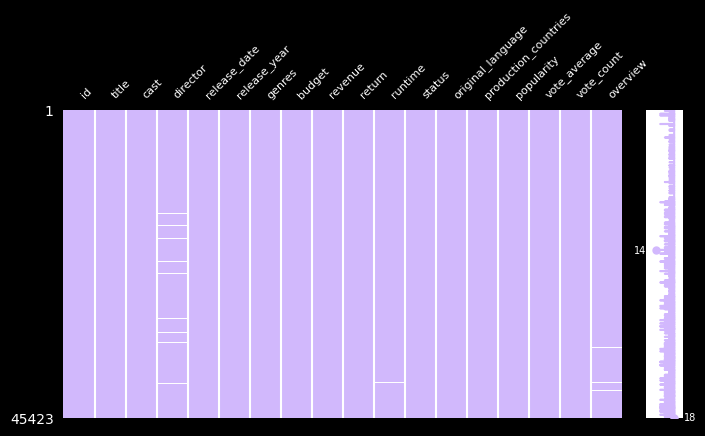

In [25]:
msno.matrix(df, figsize=(8, 4), color=(0.823, 0.722, 0.992), fontsize=8)
plt.show()

In [26]:
duplicados = df[df.duplicated()]
duplicados


,id,title,cast,director,release_date,release_year,genres,budget,revenue,return,runtime,status,original_language,production_countries,popularity,vote_average,vote_count,overview
677,105045,The Promise,"['Corinna Harfouch', 'Meret Becker', 'August Z...",Margarethe von Trotta,1995-02-16,1995,"['Drama', 'Romance']",0.0,0.0,0.000000,115.0,Released,de,['DE'],0.122178,5.0,1.0,"East-Berlin, 1961, shortly after the erection ..."
838,132641,Wife,"['Mieko Takamine', 'Ken Uehara', 'Rentarô Miku...",Mikio Naruse,1953-04-29,1953,['Drama'],0.0,0.0,0.000000,89.0,Released,ja,['JP'],0.096079,0.0,0.0,"Ten years into a marriage, the wife is disappo..."
950,22649,A Farewell to Arms,"['Helen Hayes', 'Gary Cooper', 'Adolphe Menjou']",Frank Borzage,1932-12-08,1932,"['Drama', 'Romance', 'War']",4.0,25.0,6.250000,89.0,Released,en,['US'],1.914697,6.2,29.0,British nurse Catherine Barkley (Helen Hayes) ...
2565,84198,A Place at the Table,"['Jeff Bridges', 'Tom Colicchio', 'Mariana Chi...",Kristi Jacobson,2012-03-22,2012,['Documentary'],0.0,0.0,0.000000,84.0,Released,en,['US'],0.501046,6.9,7.0,"Using personal stories, this powerful document..."
4114,10991,Pokémon: Spell of the Unknown,"['Veronica Taylor', 'Rachael Lillis', 'Eric St...",Michael Haigney,2000-07-08,2000,"['Adventure', 'Fantasy', 'Animation', 'Action'...",16000000.0,68411275.0,4.275705,93.0,Released,ja,['JP'],10.264597,6.0,143.0,When Molly Hale's sadness of her father's disa...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40258,97995,Seven Years Bad Luck,"['Max Linder', 'Alta Allen', 'Ralph McCullough']",Max Linder,1921-02-06,1921,['Comedy'],0.0,0.0,0.000000,62.0,Released,en,['US'],0.141558,5.6,4.0,"After breaking a mirror in his home, superstit..."
44783,10991,Pokémon: Spell of the Unknown,"['Veronica Taylor', 'Rachael Lillis', 'Eric St...",Michael Haigney,2000-07-08,2000,"['Adventure', 'Fantasy', 'Animation', 'Action'...",16000000.0,68411275.0,4.275705,93.0,Released,ja,['JP'],6.480376,6.0,144.0,When Molly Hale's sadness of her father's disa...
44789,12600,Pokémon 4Ever: Celebi - Voice of the Forest,"['Veronica Taylor', 'Rachael Lillis', 'Maddie ...",Kunihiko Yuyama,2001-07-06,2001,"['Adventure', 'Fantasy', 'Animation', 'Science...",0.0,28023563.0,0.000000,75.0,Released,ja,"['JP', 'US']",6.080108,5.7,82.0,"All your favorite Pokémon characters are back,..."
45224,265189,Force Majeure,"['Lisa Loven Kongsli', 'Johannes Bah Kuhnke', ...",Ruben Östlund,2014-08-15,2014,"['Comedy', 'Drama']",0.0,1359497.0,0.000000,118.0,Released,sv,"['NO', 'SE', 'FR']",12.165685,6.8,255.0,"While holidaying in the French Alps, a Swedish..."


# Analisis 

## Variables numericas

Se hacen histogramas de las variables numaricas para analizar la distribucion, el rango, los outliars, etc.

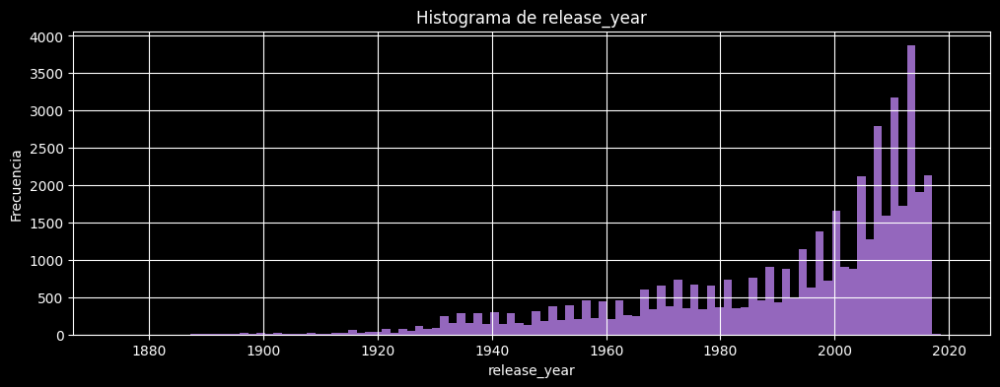

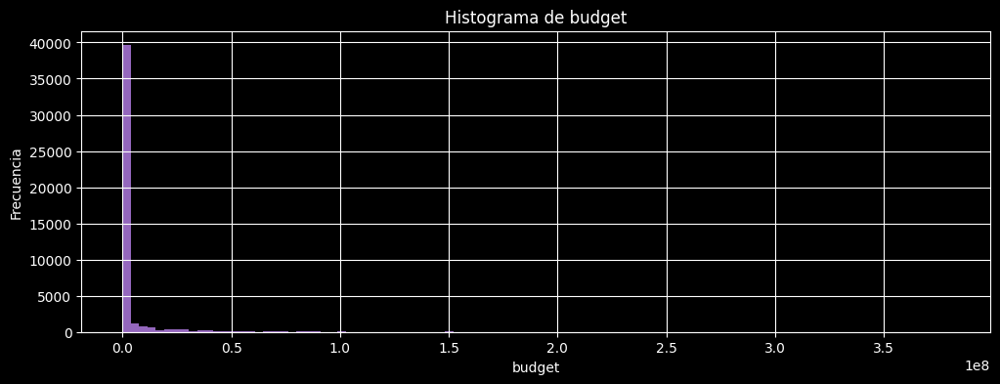

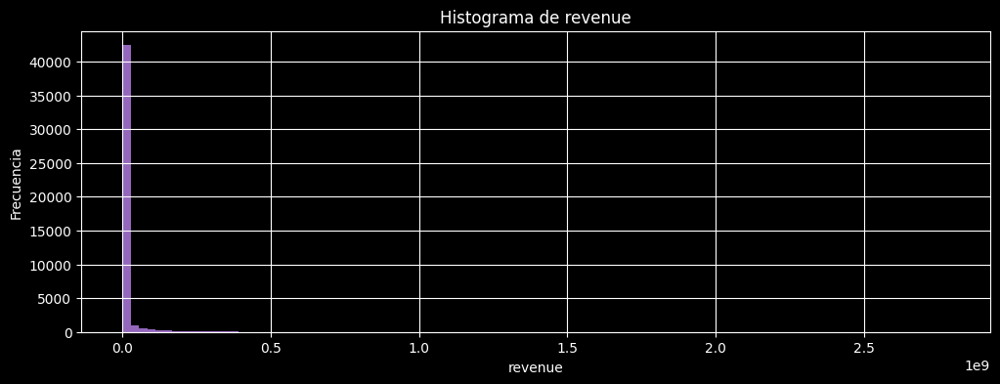

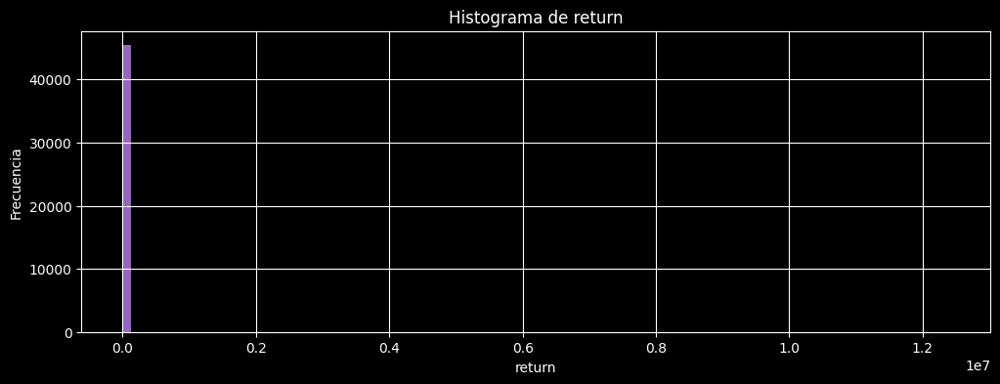

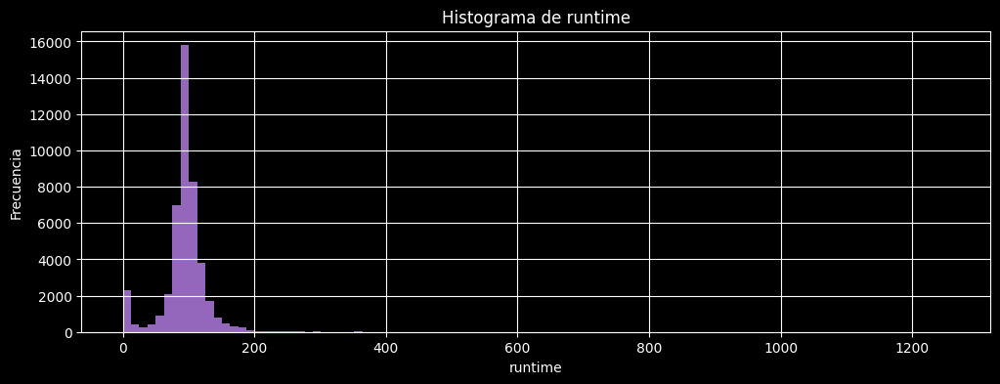

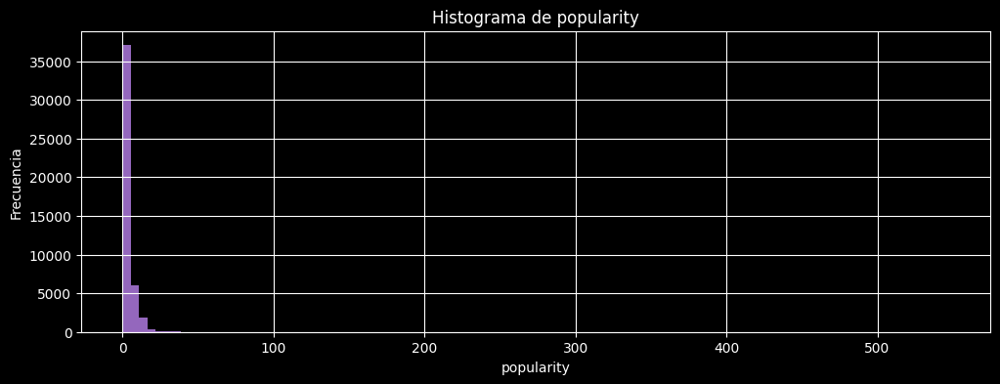

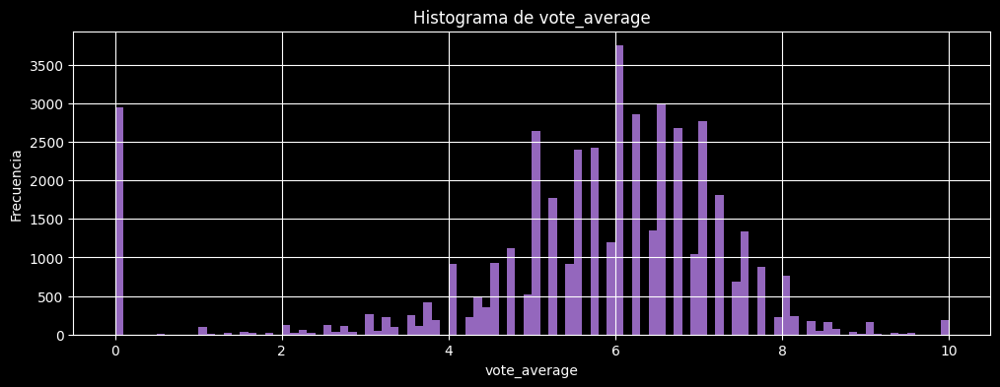

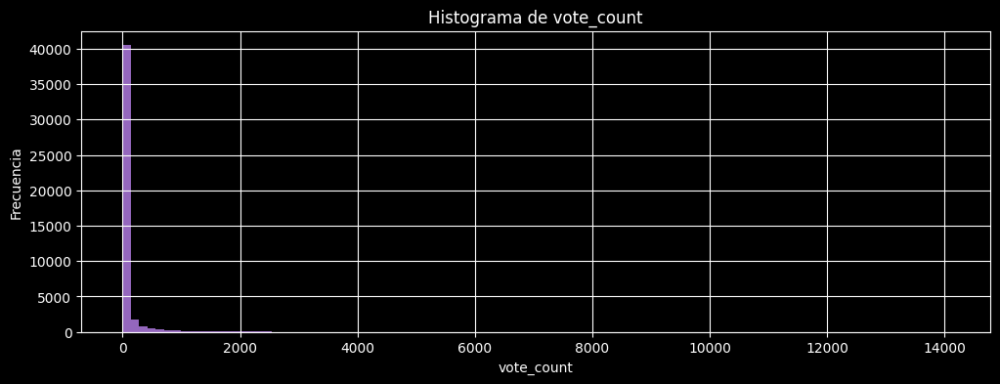

In [27]:
columnas = ['release_year', 'budget', 'revenue', 'return','runtime', 'popularity', 'vote_average', 'vote_count' ]
for i in columnas:
    plt.figure(figsize=(12,4))
    df[i].hist(bins=100,color='tab:purple')
    #plt.xlim(0, 100)
    plt.xlabel(f'{i}')
    plt.ylabel('Frecuencia')
    plt.title(f'Histograma de {i}')
    plt.show()

### Popularity
> Tiene un rango demasiado extenso y poca correlación útil con los otros datos.

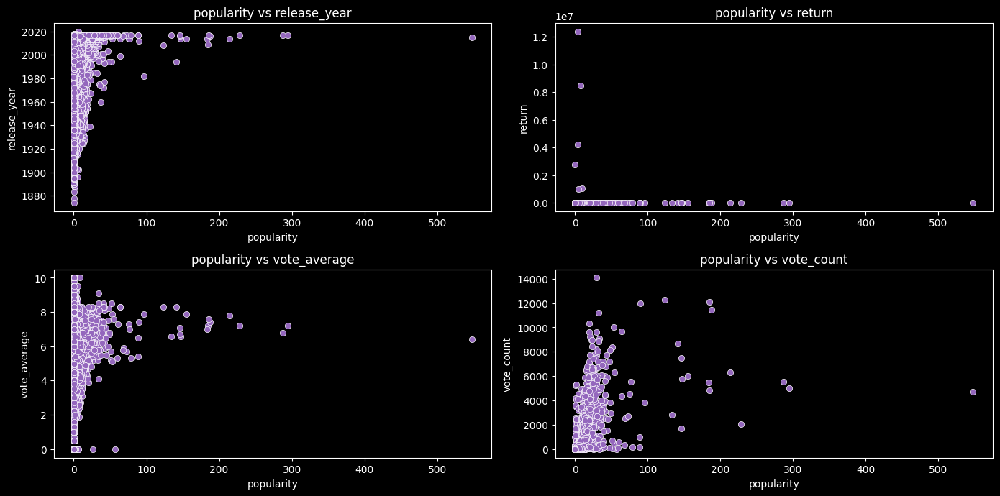

In [28]:
x_column = 'popularity'

y_columns = ['release_year', 'return', 'vote_average', 'vote_count']

plt.figure(figsize=(14, 10))
for i, y_col in enumerate(y_columns, 1):
    plt.subplot(3, 2, i)
    sns.scatterplot(data=df, x=x_column, y=y_col, color='tab:purple')
    plt.title(f'{x_column} vs {y_col}')
    plt.xlabel(x_column)
    plt.ylabel(y_col)

plt.tight_layout()
plt.show()

### Budget y Revenue

> Estas dos culumnas tiene muchos datos igual a 0, una std muy grande y su información importante ya fue extraida en la columna return.

In [29]:
df[['budget', 'revenue']].describe()

,budget,revenue
count,4.542300e+04,4.542300e+04
mean,4.233859e+06,1.122619e+07
std,1.743448e+07,6.435907e+07
min,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00
50%,0.000000e+00,0.000000e+00
75%,0.000000e+00,0.000000e+00
max,3.800000e+08,2.787965e+09


### Runtime

In [30]:
df['runtime'].describe()

count    45177.000000
mean        94.174314
std         38.338184
min          0.000000
25%         85.000000
50%         95.000000
75%        107.000000
max       1256.000000
Name: runtime, dtype: float64

In [31]:
df[df['runtime']>300]

,id,title,cast,director,release_date,release_year,genres,budget,revenue,return,runtime,status,original_language,production_countries,popularity,vote_average,vote_count,overview
6751,42044,Shoah,"['Simon Srebnik', 'Michael Podchlebnik', 'Motk...",Claude Lanzmann,1985-11-01,1985,['Documentary'],0.0,0.0,0.0,566.0,Released,en,['FR'],1.978031,8.7,36.0,Claude Lanzmann directed this 9 1/2 hour docum...
7420,140207,Tinker Tailor Soldier Spy,"['Alec Guinness', 'Michael Jayston', 'Anthony ...",John Irvin,1979-09-10,1979,"['Thriller', 'Drama', 'Mystery']",0.0,0.0,0.0,320.0,Released,en,['GB'],1.564586,7.6,10.0,"In the bleak days of the Cold War, espionage v..."
7425,11659,The Best of Youth,"['Luigi Lo Cascio', 'Alessio Boni', 'Adriana A...",Marco Tullio Giordana,2003-05-19,2003,['Drama'],0.0,0.0,0.0,366.0,Released,it,['IT'],6.040001,8.0,88.0,"Spanning four decades, from the chaotic 1960s ..."
7938,36627,The Deluge,"['Daniel Olbrychski', 'Malgorzata Braunek', 'T...",Jerzy Hoffman,1974-09-02,1974,"['History', 'Adventure', 'War']",0.0,0.0,0.0,315.0,Released,pl,['PL'],0.868637,7.4,7.0,"Following With Fire and Sword', this is an ada..."
8641,29266,War and Peace,"['Sergey Bondarchuk', 'Lyudmila Saveleva', 'Vy...",Sergey Bondarchuk,1966-03-14,1966,"['War', 'Drama', 'History', 'Romance']",100000000.0,0.0,0.0,422.0,Released,ru,['RU'],2.604571,7.5,16.0,Seven-hour epic based on the eponymous book by...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44139,444623,The Idiot,"['Evgeny Mironov', 'Lydia Velezheva', 'Vladimi...",Vladimir Bortko,2003-04-01,2003,['TV Movie'],0.0,0.0,0.0,550.0,Released,ru,[],0.074146,7.0,1.0,TV miniseries of the Dostoevsky novel.
44426,197854,The Guyver: Bio-Booster Armor,"['Takeshi Kusao', 'Yuko Mizutani', 'Hideyuki T...",Koichi Ishiguro,1989-09-25,1989,"['Science Fiction', 'Animation', 'Foreign', 'A...",0.0,0.0,0.0,360.0,Released,ja,['JP'],0.025827,6.2,5.0,Sho and his friend Tetsurou stumble upon an od...
44683,458298,The Keepers,[],Ryan White,2017-05-19,2017,"['Crime', 'Documentary', 'Drama']",0.0,0.0,0.0,432.0,Released,en,['US'],1.576170,7.9,16.0,A seven-part docuseries about the unsolved mur...
44720,128733,Hollywood,['James Mason'],Kevin Brownlow,1980-02-09,1980,[],0.0,0.0,0.0,780.0,Released,en,[],0.055713,8.0,1.0,The definitive documentary about the American ...


> Como este es un dataset de peliculas, se va a considerar un maximo de 5 horas de duración, con esto se eliminan solo 107 peliculas considerandolas outliars no utiles para recomendar

### El resto de las variables cuantitativas se aceptan como estan para no ondar más en análisis y conseguir el MVP en un tiempo aceptable.

## Variables cualitativas

In [32]:
df_expanded = df['genres'].str.split(',', expand=True).stack().reset_index(level=1, drop=True)
df_expanded = df_expanded.str.strip(" '[]'")
genre_counts=df_expanded.value_counts()
genre_counts

Drama              20282
Comedy             13191
Thriller            7627
Romance             6742
Action              6599
Horror              4674
Crime               4310
Documentary         3926
Adventure           3504
Science Fiction     3048
Family              2774
Mystery             2468
                    2384
Fantasy             2318
Animation           1938
Foreign             1623
Music               1600
History             1397
War                 1325
Western             1042
TV Movie             768
Name: count, dtype: int64

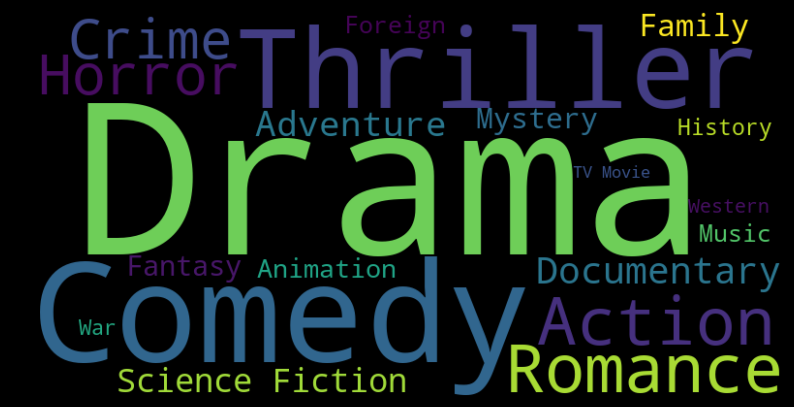

In [33]:
wordcloud = WordCloud(width=800, height=400, background_color='black').generate_from_frequencies(genre_counts)
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [34]:
df['director'].value_counts()[:25]


director
John Ford             66
Michael Curtiz        65
Werner Herzog         54
Alfred Hitchcock      53
Georges Méliès        51
Woody Allen           49
Jean-Luc Godard       47
Sidney Lumet          46
Charlie Chaplin       44
Raoul Walsh           43
William A. Wellman    42
Henry Hathaway        42
George Cukor          41
Martin Scorsese       40
Richard Thorpe        40
Ingmar Bergman        39
Frank Capra           39
Fritz Lang            38
John Huston           38
Robert Altman         37
Mervyn LeRoy          37
Robert Wise           36
Takashi Miike         36
Richard Fleischer     35
Claude Chabrol        35
Name: count, dtype: int64

In [35]:
df['status'].value_counts()[:25]


status
Released           44983
Rumored              230
Post Production       97
In Production         19
Planned               13
Canceled               1
Name: count, dtype: int64

In [36]:
df[ df['status'] =='Canceled']

,id,title,cast,director,release_date,release_year,genres,budget,revenue,return,runtime,status,original_language,production_countries,popularity,vote_average,vote_count,overview
40403,64109,Paanch,"['Kay Kay Menon', 'Aditya Srivastava', 'Aditya...",Anurag Kashyap,2003-01-01,2003,[],0.0,0.0,0.0,130.0,Canceled,en,[],0.189724,6.3,3.0,"The film is ""loosely"" based on the 1976-77 Jos..."


> La columna estatus por no esta actualizada a la fecha actual y no ser representatica de datos reales.

In [37]:
language_counts = df['original_language'].value_counts()

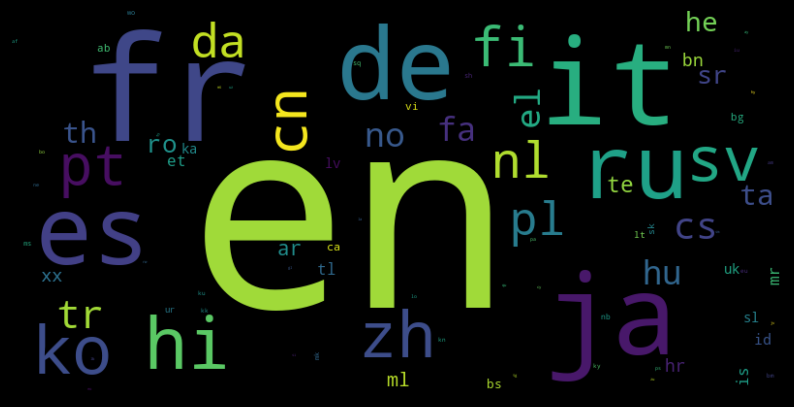

In [38]:
wordcloud = WordCloud(width=800, height=400, background_color='black').generate_from_frequencies(language_counts)
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [39]:
countries_counts = df['production_countries'].value_counts()

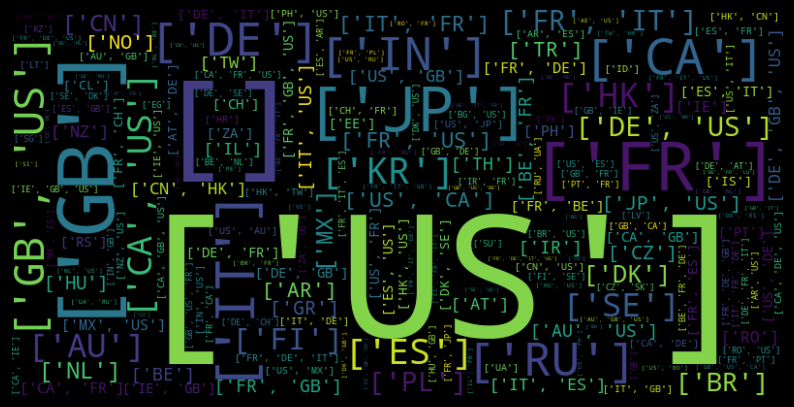

In [40]:
wordcloud = WordCloud(width=800, height=400, background_color='black').generate_from_frequencies(countries_counts)
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Preprocesamiento de Overview
Esto se realiza especificamente para poder generar el algoritmo de recomendación, asi que el proceso se encuentra en dicho archivo


# Reporte con  pandas profiling

In [41]:
ProfileReport(df, title="Reporte de Perfil de Pandas")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]